![alt text](https://thumbor.forbes.com/thumbor/960x0/https%3A%2F%2Fspecials-images.forbesimg.com%2Fimageserve%2F5fb2aa7882bd5d90444c64a3%2FThe-Home-Depot-logo-and-store-seen-in-Queens-Borough-of-New---%2F960x0.jpg%3Ffit%3Dscale "The Home Depot")

# Home Depot Product Search Relevance

Problema: Prever a relevância dos resultados de pesquisa para melhorar a experiência do consumidor no site homedepot.com

Solução: Desenvolvimento de um modelo que cumpra esse objetivo com a maior pontuação na métrica RMSE.

Os dados se encontram em https://www.kaggle.com/c/home-depot-product-search-relevance

In [1]:
from IPython.core.display import HTML
HTML(open('home_content.html', 'r').read())

<a id='libraries'></a>
<h2 style="color:DarkBlue" >Preparação do ambiente</h2>

Vamos baixar e importar as bibliotecas necessárias.

In [2]:
!pip install -U -q mapply
!pip install -U -q chars2vec
!pip install -U -q beautifulsoup4
!pip install -U -q symspellpy
!pip install -U -q thefuzz[speedup]
!pip install -U -q strsimpy
!pip install -U -q venndata
!pip install -q googletrans==4.0.0rc1
!pip install -U -q spacy
!python3 -m spacy download en_core_web_md > /dev/null

In [3]:
import pandas as pd
import numpy as np
import regex as re
import nltk
import spacy
import tensorflow as tf
from googletrans import Translator
from bs4 import BeautifulSoup
import requests
from itertools import chain, cycle
from scipy.spatial.distance import cosine
from tqdm import tqdm
from math import sqrt
import mapply
import collections
import time
import gc

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer, LabelEncoder

from venndata import venn

import seaborn as sns

import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import IPython
from IPython.core.display import HTML
from IPython.display import display_html

import warnings
warnings.filterwarnings('ignore')

import chars2vec
from nltk.stem.snowball import SnowballStemmer
import pkg_resources
from symspellpy import SymSpell, Verbosity
from thefuzz import fuzz

from strsimpy.jaro_winkler import JaroWinkler
from strsimpy.qgram import QGram
from strsimpy import SIFT4

In [4]:
tqdm.pandas()
stemmer = SnowballStemmer('english')
nlp = spacy.load('en_core_web_md')
c2v_model = chars2vec.load_model('eng_50')

sym_spell = SymSpell(max_dictionary_edit_distance=2, prefix_length=7)
dictionary_path = pkg_resources.resource_filename('symspellpy', 'frequency_dictionary_en_82_765.txt')
sym_spell.load_dictionary(dictionary_path, term_index=0, count_index=1)

jarowinkler = JaroWinkler()
qgram = QGram(2)
sift4 = SIFT4()

mapply.init(n_workers=-1,
            chunk_size=100,
            max_chunks_per_worker=8,
            progressbar=True)

In [5]:
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

<a id='load'></a>
<h2 style="color:DarkBlue" >Carregação dos dados</h2> 

In [6]:
df_train = pd.read_csv('train.csv.zip', encoding='ISO-8859-1', index_col='id')
df_pro_desc = pd.read_csv('product_descriptions.csv.zip')
df_attr = pd.read_csv('attributes.csv.zip')

In [7]:
column_meaning = pd.DataFrame([line.split(' - ') for line in 
'''id - a unique Id field which represents a (search_term, product_uid) pair
product_uid - an id for the products
product_title - the product title
product_description - the text description of the product (may contain HTML content)
search_term - the search query
relevance - the average of the relevance ratings for a given id
name - an attribute name
value - the attribute's value'''.splitlines()], columns=['Column_Name', 'Description'])

translator = Translator()
column_meaning['Description_Translated'] = column_meaning['Description'].apply(translator.translate, src='en', dest='pt').apply(getattr, args=('text',))

In [8]:
fig = go.Figure(data=[go.Table(
                header=dict(values=list(column_meaning.columns[:-1].tolist() + ['Descrição']),
                line_color='darkslategray',
                fill_color='gray',
                font=dict(color='white', size=12),
                align='left'),
                cells=dict(values=[column_meaning.Column_Name,
                                   column_meaning.Description,
                                   column_meaning.Description_Translated],
                line_color='darkslategray',
                fill_color='white',
                font = dict(color='darkslategray', size=11.1347),
                align='left'))])

fig.update_layout(title_text='Descrição dos dados')
fig.show()

In [9]:
df_train.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74067 entries, 2 to 221473
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_uid    74067 non-null  int64  
 1   product_title  74067 non-null  object 
 2   search_term    74067 non-null  object 
 3   relevance      74067 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 16.0 MB


In [10]:
df_pro_desc.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124428 entries, 0 to 124427
Data columns (total 2 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   product_uid          124428 non-null  int64 
 1   product_description  124428 non-null  object
dtypes: int64(1), object(1)
memory usage: 107.5 MB


In [11]:
df_attr.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2044803 entries, 0 to 2044802
Data columns (total 3 columns):
 #   Column       Dtype  
---  ------       -----  
 0   product_uid  float64
 1   name         object 
 2   value        object 
dtypes: float64(1), object(2)
memory usage: 310.9 MB


A quantidade de valores nulos nos três datasets:

In [12]:
df1_styler = df_train.isna().sum().to_frame().rename(columns={0: "Nulos"}).style.set_table_attributes("style='display:inline'").set_caption('df_train')
df2_styler = df_pro_desc.isna().sum().to_frame().rename(columns={0: "Nulos"}).style.set_table_attributes("style='display:inline'").set_caption('df_pro_desc')
df3_styler = df_attr.isna().sum().to_frame().rename(columns={0: "Nulos"}).style.set_table_attributes("style='display:inline'").set_caption('df_attr')
space = "\xa0" * 10
display_html(df1_styler._repr_html_() + space  + df2_styler._repr_html_() + space  + df3_styler._repr_html_(), raw=True)

,Nulos
product_uid,0
product_title,0
search_term,0
relevance,0
,Nulos
product_uid,0
product_description,0
,Nulos
product_uid,155
name,155


Vamos nos atentar aos valores nulos do dataset df_attr.

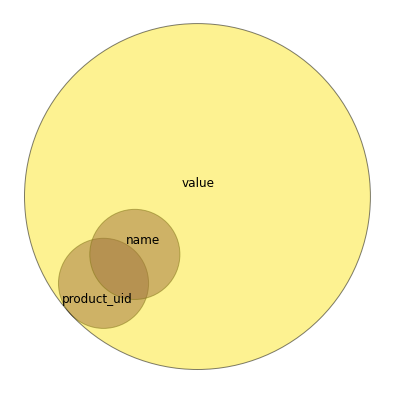

In [13]:
df_attr_copy = df_attr.copy()
df_attr_copy['product_uid'] = df_attr_copy.product_uid.map(lambda x: 1 if np.isnan(x) else 0)
df_attr_copy['name'] = df_attr_copy.name.map(lambda x: 1 if pd.isnull(x) else 0)
df_attr_copy['value'] = df_attr_copy.value.map(lambda x: 1 if pd.isnull(x) else 0)

fineTune=False
matplotlib.rcParams['figure.figsize'] = [7, 7]
labels, radii, actualOverlaps, disjointOverlaps = venn.df2areas(df_attr_copy, fineTune=fineTune)
fig, ax = venn.venn(radii, actualOverlaps, disjointOverlaps, labels=labels, labelsize=12, cmap=None, fineTune=fineTune)
matplotlib.rcParams['figure.figsize'] = [6.4, 4.8]

del df_attr_copy
throw = gc.collect()

Percebe-se que a maior quantidade desses valores ser concentra na coluna value. Pelo menos não existe um product_uid nulo que contenha alguma informação.

<a id='eda'></a>
<h2 style="color:DarkBlue" >Análise exploratória</h2> 

In [14]:
fig = px.histogram(df_train,
                x='relevance',
                color='relevance',
                title='Relevância')

fig.update_layout(showlegend=False)
fig.show()

Nota-se que os valores possuem natureza categórica. Alguns aparecem com uma frequência muito baixa, como é mostrado abaixo:

In [15]:
df_train['relevance'].value_counts().tail(6)

2.50    19
2.75    11
2.25    11
1.75     9
1.50     5
1.25     4
Name: relevance, dtype: int64

In [16]:
fig = px.histogram(df_train.sort_values(by='relevance', ascending=True),
                   x=df_train['search_term'].str.len(),
                   labels={'x': 'chars'},
                   color='relevance',
                   color_discrete_sequence=sns.color_palette('plasma_r', 13).as_hex(),
                   title='Relação entre a quantidade de caracteres dos termos pesquisados e a relevância')

fig.update_layout(xaxis_title='quantidade de caracteres', legend={'traceorder':'reversed'})
fig.show()

In [17]:
fig = px.histogram(df_train.sort_values(by='relevance', ascending=True),
                   x=df_train['product_title'].str.len(),
                   labels={'x': 'chars'},
                   color='relevance',
                   color_discrete_sequence=sns.color_palette('plasma_r', 13).as_hex(),
                   title='Relação entre a quantidade de caracteres dos títulos dos produtos e a relevância')

fig.update_layout(xaxis_title='quantidade de caracteres', legend={'traceorder':'reversed'})
fig.show()

A relevância não se modifica pela quantidade de caracteres presentes nos termos pesquisados e nos títulos dos produtos.

In [18]:
words_search_term, words_product_title = collections.Counter(), collections.Counter()
throw, throw2 = [words_search_term.update(title.lower().split()) for title in df_train.search_term], [words_product_title.update(title.lower().split()) for title in df_train.product_title]

In [19]:
fig = go.Figure(data=[go.Table(
                header=dict(values=['palavra', 'contagem'],
                line_color='darkslategray',
                fill_color='gray',
                font=dict(color='white', size=12),
                align='center'),
                cells=dict(values=[[w[0] for w in words_search_term.most_common()], [c[1] for c in words_search_term.most_common()]],
                line_color='darkslategray',
                fill_color='white',
                font = dict(color='darkslategray', size=11),
                align='center'))])

fig.update_layout(title_text='Palavras mais frequentes nos termos pesquisados')
fig.show()

In [20]:
fig = go.Figure(data=[go.Table(
                header=dict(values=['palavra', 'contagem'],
                line_color='darkslategray',
                fill_color='gray',
                font=dict(color='white', size=12),
                align='center'),
                cells=dict(values=[[w[0] for w in words_product_title.most_common()], [c[1] for c in words_product_title.most_common()]],
                line_color='darkslategray',
                fill_color='white',
                font = dict(color='darkslategray', size=11),
                align='center'))])

fig.update_layout(title_text='Palavras mais frequentes nos títulos dos produtos')
fig.show()

In [21]:
df_attr_name_count = df_attr.groupby(df_attr['name'].str.lower()).size().sort_values(ascending=False).reset_index(name='count')

In [22]:
fig = go.Figure(data=[go.Table(
                header=dict(values=['nome', 'contagem'],
                line_color='darkslategray',
                fill_color='gray',
                font=dict(color='white', size=12),
                align='center'),
                cells=dict(values=[df_attr_name_count.name.values, df_attr_name_count['count'].values],
                line_color='darkslategray',
                fill_color='white',
                font = dict(color='darkslategray', size=11),
                align='center'))])

fig.update_layout(title_text='Nomes mais frequentes dos atributos dos produtos')
fig.show()

Vamos unir os atributos mais frequentes do df_attr no df_train para facilitar as análises.

In [23]:
t_copy = df_train.copy()
top_cols = df_attr.groupby(['name']).size().sort_values(ascending=False).reset_index(name='count')[:35]['name'].values
for col in top_cols:
    t_copy = pd.merge(t_copy, df_attr[df_attr.name == col][['product_uid', 'value']].rename(columns={'value': col}), on='product_uid', how='left')

In [24]:
t_copy

,product_uid,product_title,search_term,relevance,MFG Brand Name,Bullet02,Bullet03,Bullet04,Bullet01,Product Width (in.),...,Commercial / Residential,Bullet12,ENERGY STAR Certified,Hardware Included,Package Quantity,Bullet13,Flooring Product Type,Color,Tools Product Type,Included
0,100001,Simpson Strong-Tie 12-Gauge Angle,angle bracket,3.00,Simpson Strong-Tie,Stronger than angled nailing or screw fastenin...,Help ensure joints are consistently straight a...,Dimensions: 3 in. x 3 in. x 1-1/2 in.,Versatile connector for various 90° connection...,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100001,Simpson Strong-Tie 12-Gauge Angle,l bracket,2.50,Simpson Strong-Tie,Stronger than angled nailing or screw fastenin...,Help ensure joints are consistently straight a...,Dimensions: 3 in. x 3 in. x 1-1/2 in.,Versatile connector for various 90° connection...,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100002,BEHR Premium Textured DeckOver 1-gal. #SC-141 ...,deck over,3.00,BEHR Premium Textured DeckOver,100% acrylic solid color coating,Resists cracking and peeling and conceals spli...,"Provides a durable, mildew resistant finish","Revives wood and composite decks, railings, po...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100005,Delta Vero 1-Handle Shower Only Faucet Trim Ki...,rain shower head,2.33,Delta,Includes the handle,Maintains a balanced pressure of hot and cold ...,Due to WaterSense regulations in the state of ...,"Includes the trim kit only, the rough-in kit (...",7.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100005,Delta Vero 1-Handle Shower Only Faucet Trim Ki...,shower only faucet,2.67,Delta,Includes the handle,Maintains a balanced pressure of hot and cold ...,Due to WaterSense regulations in the state of ...,"Includes the trim kit only, the rough-in kit (...",7.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74944,206638,Atlantic Windowpane 576 CD or 192 DVD Blu-Ray ...,tv riser glass,1.00,Atlantic,Tempered glass windows,Adjustable shelves for optimal media storage c...,Thick base and frame provide greater stability...,"Holds 216 Blu-rays, 192 DVDs or 576 CDs",32,...,NaN,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN
74945,206639,Philips 40-Watt Halogen R20 Flood Light Bulb (...,r20 halogen light,3.00,Philips,Estimated yearly energy cost: $4.82 (Based on ...,Life hours: 2.7 years (Based on 3 hrs/day),Light appearance: 2700K (soft white),Brightness: 590 Lumens,2.3748031496,...,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN
74946,206641,Schlage Camelot In-Active Aged Bronze Handlese...,schlage lock siena half dummy knob with,2.33,Schlage,Adjustable throughbolt can move up and down 1-...,Self-aligning screw holes make installation ea...,Latch retracted by thumbpiece from outside or ...,Use with 1-5/8 in. to 1-3/4 in. door,NaN,...,NaN,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN
74947,206648,Plastec 11 in. x 24 in. Rose Garden Wall Decor...,zen garden decor,3.00,Plastec,Finished in Dark Bronze powder coat,Stylized roses have broad appeal,Great for all decors,Indoor and outdoor use,24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Em df_pro_desc, no product_uid 206641, temos o seguinte dado:

In [25]:
HTML(df_pro_desc[df_pro_desc['product_uid'] == 206641]['product_description'].values[0])

Há frases que não estão separadas por espaços. Isso é um simples erro ou uma informação relevante?

In [26]:
s, colors, searchs = df_pro_desc[df_pro_desc['product_uid'] == 206641]['product_description'].values[0], cycle(px.colors.sequential.Plasma), t_copy[t_copy['product_uid'] == 206641].loc[:, 'MFG Brand Name':]

for col in searchs:
    s = re.sub(r'({})'.format(searchs[col].values[0]), '''<span title="{}"><font color="{}">{}</span><font color="black">'''.format(col, next(colors), r'\1'), s)

HTML(s)

Elas tem ligação direta com os atributos dos produtos.

Obs: Passando o mouse sobre as frases destacadas pode-se ver o tipo de atributo ao qual pertencem.

In [27]:
t_copy.loc[:, 'MFG Brand Name':].isna().sum().sort_values(ascending=False)

Package Quantity               71059
Flooring Product Type          71048
Tools Product Type             70956
Color                          70868
Included                       70511
Hardware Included              70380
Bullet13                       69779
ENERGY STAR Certified          68536
Commercial / Residential       68428
Bullet12                       67797
Indoor/Outdoor                 66236
Bullet11                       65378
Product Length (in.)           63750
Bullet10                       62990
Assembled Depth (in.)          62474
Assembled Width (in.)          62386
Assembled Height (in.)         62345
Bullet09                       58853
Certifications and Listings    57131
Color/Finish                   55705
Bullet08                       54522
Material                       54269
Bullet07                       49275
Color Family                   47522
Product Weight (lb.)           44242
Bullet06                       42036
Product Depth (in.)            38432
P

O fato de os produtos não possuirem os mesmos atributos explica a quantidade de valores nulos.

In [28]:
del t_copy
gc.collect()

3490

Os atributos do df_attr serão unidos ao df_train.

In [29]:
df_train = pd.merge(df_train, df_attr[df_attr.name == 'MFG Brand Name'][['product_uid', 'value']].rename(columns={'value': 'brand'}), how='left', on='product_uid')
df_train = pd.merge(df_train, df_pro_desc, how='left', on='product_uid')
df_train['brand'].fillna('', inplace=True)

df_train = pd.merge(df_train, df_attr[df_attr.name == 'Color Family'][['product_uid', 'value']].rename(columns={'value': 'color_family'}), how='left', on='product_uid')
df_train['color_family'].fillna('', inplace=True)

df_train = pd.merge(df_train, df_attr.groupby('product_uid').agg({'name': lambda s : '\t'.join(s.astype(str))}).reset_index().rename(columns={'name': 'prod_attr_name'}), how='left', on='product_uid')
df_train = pd.merge(df_train, df_attr.groupby('product_uid').agg({'value': lambda s : '\t'.join(s.astype(str))}).reset_index().rename(columns={'value': 'prod_attr_value'}), how='left', on='product_uid')

<a id='feature_engineering'></a>
<h2 style="color:DarkBlue" >Engenharia de atributos</h2> 

Funções de ajuda

In [30]:
def textNormalization(s) :
    s = s.replace("("," ")
    s = s.replace(")"," ")
    s = s.replace("\""," ")
    s = s.replace(","," ")
    s = s.replace("$"," ")
    s = s.replace("?"," ")
    s = s.replace("-"," ")
    s = s.replace("//","/")
    s = s.replace("..",".")
    s = s.replace(" \\ "," ")
    s = re.sub(r"([0-9]+)( *)/( *)([0-9]+)", r"\1 \4", s)
    s = re.sub(r"(\d+)[\.\-]*([a-zA-Z]+)", r"\1 \2", s)
    s = re.sub(r"([a-zA-Z]+)[\.\-]*(\d+)", r"\1 \2", s)
    s = re.sub(r"([a-z])( *)\.( *)([a-z])", r"\1 \4", s)
    s = re.sub(r"([a-z])( *)/( *)([a-z])", r"\1 \4", s)
    s = re.sub(r"([a-z])([A-Z])", r"\1 \2", s)
    s = re.sub(r" x |\*| by ", r" xbi ", s)
    s = re.sub(r"([0-9])( *)\.( *)([0-9])", r"\1.\4", s)
    s = re.sub(r"([0-9]+)( *)(inches|inch|in|')\.?", r"\1 in. ", s)
    s = re.sub(r"([0-9]+)( *)(foot|feet|ft|'')\.?", r"\1 ft. ", s)
    s = re.sub(r"([0-9]+)( *)(pounds|pound|lbs|lb)\.?", r"\1 lb. ", s)
    s = re.sub(r"([0-9]+)( *)(square|sq) ?\.?(feet|foot|ft)\.?", r"\1 sq.ft. ", s)
    s = re.sub(r"([0-9]+)( *)(cubic|cu) ?\.?(feet|foot|ft)\.?", r"\1 cu.ft. ", s)
    s = re.sub(r"([0-9]+)( *)(gallons|gallon|gal)\.?", r"\1 gal. ", s)
    s = re.sub(r"([0-9]+)( *)(ounces|ounce|oz)\.?", r"\1 oz. ", s)
    s = re.sub(r"([0-9]+)( *)(centimeters|cm)\.?", r"\1 cm. ", s)
    s = re.sub(r"([0-9]+)( *)(milimeters|mm)\.?", r"\1 mm. ", s)
    s = re.sub(r"([0-9]+)( *)(°|degrees|degree)\.?", r"\1 deg. ", s)
    s = re.sub(r"([0-9]+)( *)(v|volts|volt)\.?", r"\1 volt. ", s)
    s = re.sub(r"([0-9]+)( *)(watts|watt)\.?", r"\1 watt. ", s)
    s = re.sub(r"([0-9]+)( *)(amperes|ampere|amps|amp)\.?", r"\1 amp. ", s)
    s = re.sub(r"(\s+)", r" ", s)
    s = s.lower()
    s = ' '.join([stemmer.stem(y) for y in s.split()])
    return s

In [31]:
def str_count_common_units(str1, str2):
    count = 0
    tmpWords1 = str1.split()
    tmpWords2 = str2.split()
    for unit in {'in.', 'ft.', 'lb.', 'sq.', 
                 'cu.', 'gal.', 'oz.', 'cm.',
                 'mm.', 'deg.', 'volt.', 'watt.',
                 'amp.'}:
        for word1 in tmpWords1:
            for word2 in tmpWords2:
                if word1.find(unit) > -1 and word2.find(unit) > -1:
                    count += 1
    return count

In [32]:
color_url = 'http://colours.neilorangepeel.com/'
headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 6.3; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/60.0.3112.113 Safari/537.36'}

colorfile = requests.get(color_url, headers=headers).content
soup = BeautifulSoup(colorfile, 'html.parser')
colors = soup.find_all('h1')
colors_names = [color.string for color in colors]

del color_url, headers, colorfile, soup, colors
throw = gc.collect()

def str_count_same_colors(str1, str2):
    count = 0
    tmpWords1 = str1.split()
    tmpWords2 = str2.split()
    
    for word1 in tmpWords1:
        for word2 in tmpWords2:
            if word1 == word2 and word1 in colors_names:
                count += 1
    return count

In [33]:
def chars2vec_distance(words1, words2):
    words1_embeddings = c2v_model.vectorize_words(words1)
    words2_embeddings = c2v_model.vectorize_words(words2)
    ml = max(len(words1_embeddings), len(words2_embeddings))
    w1 = list(map(float, chain.from_iterable(np.concatenate((words1_embeddings , np.zeros((ml - len(words1_embeddings), 50)))))))
    w2 = list(map(float, chain.from_iterable(np.concatenate((words2_embeddings , np.zeros((ml - len(words2_embeddings), 50)))))))
    return np.dot(w1, w2) / (np.linalg.norm(w1) * np.linalg.norm(w2))

In [34]:
pipe = make_pipeline(TfidfVectorizer(analyzer='word', min_df=3, max_df=0.7, stop_words='english', ngram_range=(1, 2), max_features=10000),
                     TruncatedSVD(n_components=50, random_state=0),
                     Normalizer(copy=False))

df_idf = pd.concat([pd.DataFrame([[dims] for dims in pipe.fit_transform(df_train['search_term'])], index=df_train.index, columns=['search_term_vec']),
                    pd.DataFrame([[dims] for dims in pipe.fit_transform(df_train['product_title'])], index=df_train.index, columns=['product_title_vec']),
                    pd.DataFrame([[dims] for dims in pipe.fit_transform(df_train['product_description'])], index=df_train.index, columns=['product_description_vec']),
], axis=1)

Os dados serão normalizados retirando as pontuações, renomeando medidas semelhantes para um mesmo termo e realizando stemming. 

In [35]:
start_time = time.time()

df_train['search_term'] = df_train['search_term'].progress_apply(lambda x: ' '.join([sym_spell.lookup(y, Verbosity.TOP, max_edit_distance=1, include_unknown=True, ignore_token=r"[\d\&]+")[0].term for y in x.split()]))
df_train['search_term'] = df_train['search_term'].progress_apply(textNormalization)
df_train['brand'] = df_train['brand'].progress_apply(textNormalization)
df_train['product_title'] = df_train['product_title'].progress_apply(textNormalization)
df_train['product_description'] = df_train['product_description'].mapply(textNormalization)

print('--- Normalização do texto: %s minutos ---' % round(((time.time() - start_time) / 60), 2))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:27<00:00, 2667.27it/s]


  0%|                                                                                                         …

--- Normalização do texto: 1.69 minutos ---


Geração de atributos para o modelo:

In [36]:
#Length
start_time = time.time()

df_train['len_of_query_words'] = df_train['search_term'].progress_apply(lambda x: len(x.split()))
df_train['len_of_query_chars'] = df_train['search_term'].progress_apply(len)

df_train['len_of_title_words'] = df_train['product_title'].progress_apply(lambda x: len(x.split()))
df_train['len_of_title_chars'] = df_train['product_title'].progress_apply(len)

df_train['len_of_description_words'] = df_train['product_description'].progress_apply(lambda x: len(x.split()))
df_train['len_of_description_chars'] = df_train['product_description'].progress_apply(len)

df_train['len_of_color_family_words'] = df_train['color_family'].progress_apply(lambda x: len(re.findall(r'\w+', x.replace(" / ", "/"))))
df_train['len_of_color_family_chars'] = df_train['color_family'].progress_apply(len)

df_train['len_of_brand_words'] = df_train['brand'].progress_apply(lambda x: len(x.split()))
df_train['len_of_brand_chars'] = df_train['brand'].progress_apply(len)

print('--- Atributos em relação ao tamanho das sentenças: %s minutos ---\n' % round(((time.time() - start_time) / 60), 2))


#Vowels
start_time = time.time()

df_train['len_of_vowels_in_query'] = df_train['search_term'].progress_apply(lambda x: sum([len(re.sub('[^aeiou]', '', word)) for word in x.split()]))
df_train['len_of_vowels_in_title'] = df_train['product_title'].progress_apply(lambda x: sum([len(re.sub('[^aeiou]', '', word)) for word in x.split()]))
df_train['len_of_vowels_in_description'] = df_train['product_description'].progress_apply(lambda x: sum([len(re.sub('[^aeiou]', '', word)) for word in x.split()]))
df_train['len_of_vowels_in_color_family'] = df_train['color_family'].map(lambda x: sum([len(re.sub('[^aeiou]', '', word)) for word in re.findall(r'\w+', x.replace(" / ", "/"))]))
df_train['len_of_vowels_in_brand'] = df_train['brand'].progress_apply(lambda x: sum([len(re.sub('[^aeiou]', '', word)) for word in x.split()]))

print('--- Atributos em relação à quantidade de vogais das sentenças: %s minutos ---\n' % round(((time.time() - start_time) / 60), 2))


#Digits
start_time = time.time()

df_train['len_of_digits_in_query'] = df_train['search_term'].progress_apply(lambda x: sum([word.isdigit() for word in x.split()]))
df_train['len_of_digits_in_title'] = df_train['product_title'].progress_apply(lambda x: sum([word.isdigit() for word in x.split()]))
df_train['len_of_digits_in_description'] = df_train['product_description'].progress_apply(lambda x: sum([word.isdigit() for word in x.split()]))
df_train['len_of_digits_in_color_family'] = df_train['color_family'].progress_apply(lambda x: sum([word.isdigit() for word in x.split()]))
df_train['len_of_digits_in_brand'] = df_train['brand'].progress_apply(lambda x: sum([word.isdigit() for word in x.split()]))

print('--- Atributos em relação à quantidade de dígitos das sentenças: %s minutos ---\n' % round(((time.time() - start_time) / 60), 2))


#Match
start_time = time.time()

df_train['query_first_word_in_title'] = df_train.progress_apply(lambda x : (x['search_term'].split()[0] in x['product_title'].split()) * 1, axis=1)
df_train['query_first_word_in_description'] = df_train.progress_apply(lambda x : (x['search_term'].split()[0] in x['product_description'].split()) * 1, axis=1)

df_train['query_last_word_in_title'] = df_train.progress_apply(lambda x : (x['search_term'].split()[-1] in x['product_title'].split()) * 1, axis=1)
df_train['query_last_word_in_description'] = df_train.progress_apply(lambda x : (x['search_term'].split()[-1] in x['product_description'].split()) * 1, axis=1)

print('--- Atributos em relação às palavras em comum das sentenças: %s minutos ---\n' % round(((time.time() - start_time) / 60), 2))


#Similarity1
start_time = time.time()

df_train['fuzz_distance_query_first_word_and_title'] = df_train.progress_apply(lambda x: fuzz.ratio(x['search_term'].split()[0], x['product_title']), axis=1)
df_train['fuzz_distance_query_last_word_and_title'] = df_train.progress_apply(lambda x: fuzz.ratio(x['search_term'].split()[-1], x['product_title']), axis=1)

df_train['fuzz_partial_distance_query_first_word_and_title'] = df_train.progress_apply(lambda x: fuzz.token_sort_ratio(x['search_term'].split()[0], x['product_title']), axis=1)
df_train['fuzz_partial_distance_query_last_word_and_title'] = df_train.progress_apply(lambda x: fuzz.token_sort_ratio(x['search_term'].split()[-1], x['product_title']), axis=1)

df_train['jarowinkler_distance_query_first_word_and_title'] = df_train.progress_apply(lambda x: jarowinkler.distance(x['search_term'].split()[0], x['product_title']), axis=1)
df_train['jarowinkler_distance_query_last_word_and_title'] = df_train.progress_apply(lambda x: jarowinkler.distance(x['search_term'].split()[-1], x['product_title']), axis=1)

df_train['qgram_distance_query_first_word_and_title'] = df_train.progress_apply(lambda x: qgram.distance(x['search_term'].split()[0], x['product_title']), axis=1)
df_train['qgram_distance_query_last_word_and_title'] = df_train.progress_apply(lambda x: qgram.distance(x['search_term'].split()[-1], x['product_title']), axis=1)

df_train['sift4_distance_query_first_word_and_title'] = df_train.progress_apply(lambda x: sift4.distance(x['search_term'].split()[0], x['product_title']), axis=1)
df_train['sift4_distance_query_last_word_and_title'] = df_train.progress_apply(lambda x: sift4.distance(x['search_term'].split()[-1], x['product_title']), axis=1)

print('--- Atributos em relação à similaridade: %s minutos ---\n' % round(((time.time() - start_time) / 60), 2))


#Similarity2
start_time = time.time()

df_train['fuzz_distance_query_title'] = df_train.progress_apply(lambda x: fuzz.ratio(x['search_term'], x['product_title']), axis=1)
df_train['fuzz_distance_query_description'] = df_train.progress_apply(lambda x: fuzz.ratio(x['search_term'], x['product_description']), axis=1)

df_train['fuzz_partial_distance_query_title'] = df_train.progress_apply(lambda x: fuzz.token_sort_ratio(x['search_term'], x['product_title']), axis=1)
df_train['fuzz_partial_distance_query_brand'] = df_train.progress_apply(lambda x: fuzz.token_sort_ratio(x['search_term'], x['brand']), axis=1)
df_train['fuzz_partial_distance_query_description'] = df_train.progress_apply(lambda x: fuzz.token_sort_ratio(x['search_term'], x['product_description']), axis=1)

df_train['jarowinkler_distance_query_title'] = df_train.progress_apply(lambda x: jarowinkler.distance(x['search_term'], x['product_title']), axis=1)
df_train['jarowinkler_distance_query_description'] = df_train.progress_apply(lambda x: jarowinkler.distance(x['search_term'], x['product_description']), axis=1)

df_train['qgram_distance_query_title'] = df_train.progress_apply(lambda x: qgram.distance(x['search_term'], x['product_title']), axis=1)
df_train['qgram_distance_query_description'] = df_train.progress_apply(lambda x: qgram.distance(x['search_term'], x['product_description']), axis=1)

df_train['sift4_distance_query_title'] = df_train.progress_apply(lambda x: sift4.distance(x['search_term'], x['product_title']), axis=1)
df_train['sift4_distance_query_description'] = df_train.progress_apply(lambda x: sift4.distance(x['search_term'], x['product_description']), axis=1)

df_train['cosine_distance_query_title'] = df_idf.progress_apply(lambda x: 1 - cosine(x['search_term_vec'], x['product_title_vec']), axis=1)
df_train['cosine_distance_query_description'] = df_idf.progress_apply(lambda x: 1 - cosine(x['search_term_vec'], x['product_description_vec']), axis=1)

print('--- Atributos em relação à similaridade 2: %s minutos ---\n' % round(((time.time() - start_time) / 60), 2))


#New
start_time = time.time()

df_train['num_of_bullets'] = df_train['prod_attr_name'].map(lambda x: len(re.findall(r"Bullet([0-9]+)", str(x))))
df_train['common_units_measurement'] = df_train.progress_apply(lambda x: str_count_common_units(x['search_term'], str(x['prod_attr_value'])), axis=1)
df_train['common_colors'] = df_train.progress_apply(lambda x: str_count_same_colors(x['search_term'], str(x['prod_attr_value'])), axis=1)

df_train['common_words_between_query_title'] = df_train.progress_apply(lambda x: len(set(x['search_term'].split()).intersection(set(x['product_title'].split()))), axis=1)
df_train['common_words_between_query_description'] = df_train.progress_apply(lambda x: len(set(x['search_term'].split()).intersection(set(x['product_description'].split()))), axis=1)
df_train['ratio_between_title_query'] = df_train['len_of_title_words'] / df_train['len_of_query_words']
df_train['ratio_between_description_query'] = df_train['len_of_description_words'] / df_train['len_of_query_words']

df_train['common_words_between_brand_query'] = df_train.progress_apply(lambda x: len(set(x['brand'].split()).intersection(set(x['search_term'].split()))), axis=1)
df_train['ratio_brand'] = (df_train['common_words_between_brand_query'] / df_train['len_of_brand_words']).fillna(-1, inplace=False)
df_train['brand_number'] = LabelEncoder().fit_transform(df_train['brand'])

print('--- Novos atributos: %s minutos ---' % round(((time.time() - start_time) / 60), 2))

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:00<00:00, 623481.58it/s]


--- Atributos em relação ao tamanho das sentenças: 0.04 minutos ---



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:00<00:00, 104584.71it/s]


--- Atributos em relação à quantidade de vogais das sentenças: 1.05 minutos ---



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:00<00:00, 426423.64it/s]


--- Atributos em relação à quantidade de dígitos das sentenças: 0.04 minutos ---



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:02<00:00, 29566.22it/s]


--- Atributos em relação às palavras em comum das sentenças: 0.14 minutos ---



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:04<00:00, 17638.81it/s]


--- Atributos em relação à similaridade: 0.7 minutos ---



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:05<00:00, 12461.95it/s]


--- Atributos em relação à similaridade 2: 2.19 minutos ---



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:01<00:00, 39050.04it/s]

--- Novos atributos: 0.85 minutos ---


Seria interessante usar word embedding para calcular a similidade entre os atributos.

In [37]:
old_train = pd.read_csv('train.csv.zip', encoding='ISO-8859-1', index_col='id')
spacy_words = set(nlp.vocab.strings)
train_sentences = [row.lower() for row in old_train.search_term.values] + [row.lower() for row in old_train.product_title.values]
train_words = list(map(str, chain.from_iterable([sentence.split() for sentence in train_sentences])))
print('{} palavras em comum do total de {}.'.format(len(set(train_words).intersection(set(spacy_words))), len(set(train_words))))
del old_train, spacy_words, train_words
throw = gc.collect()

16638 palavras em comum do total de 31587.


Mas como boa parte das palavras não estão no vocabulário da biblioteca SpaCy, optamos por usar [Chars2vec](https://github.com/IntuitionEngineeringTeam/chars2vec).

In [38]:
df_train['chars2vec_distance_query_title'] = df_train.progress_apply(lambda x : chars2vec_distance(x['search_term'].split(), x['product_title'].split()), axis=1)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [11:31<00:00, 107.70it/s]


In [39]:
tokenizer = tf.keras.preprocessing.text.Tokenizer(split='', char_level=True, filters='!"#$%&()*+,-/:;<=>?@[\\]^_`{|}~\t\n')
corpus = [row.replace(" ","") for row in df_train.search_term.values] + [row.replace(" ","") for row in df_train.product_title.values]
tokenizer.fit_on_texts(corpus)

keys = tokenizer.word_index.values()
values = [0 for i in range(len(keys))]
dictionary = dict(zip(keys, values))
columns = ['search_term_char' + str(i) for i in range(len(tokenizer.word_index))] + ['product_title_char' + str(i) for i in range(len(tokenizer.word_index))]

del corpus, keys, values
throw = gc.collect()

def count_chars(str1, str2):
    s1 = tokenizer.texts_to_sequences(str1)
    s2 = tokenizer.texts_to_sequences(str2)
    s1 = list(map(int, chain.from_iterable(s1)))
    s2 = list(map(int, chain.from_iterable(s2)))
    dic1, dic2 = dictionary.copy(), dictionary.copy()
    dic1.update(collections.Counter(s1))
    dic2.update(collections.Counter(s2))
    return pd.Series(list(dic1.values()) + list(dic2.values()))

Vamos criar novas colunas que representam a quantidade de cada caracter presente no termo pesquisado e no título do produto.

In [40]:
df_train[columns] = df_train.progress_apply(lambda x: count_chars(x['search_term'], x['product_title']), axis=1)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 74495/74495 [00:31<00:00, 2380.32it/s]


In [41]:
del stemmer, nlp, c2v_model, sym_spell, dictionary_path, jarowinkler, qgram, pipe, df_idf, tokenizer, dictionary, columns
throw = gc.collect()

In [42]:
df_train.to_csv('my_train.csv.xz', index=False)

In [43]:
IPython.Application.instance().kernel.do_shutdown(True) #automatically restarts kernel

{'status': 'ok', 'restart': True}

<a id='train'></a>
<h2 style="color:DarkBlue" >Treino</h2>

Vamos utilizar Random Forests como modelo regressor.

In [44]:
!pip install -U -q eli5

In [45]:
import pandas
import pandas as pd
import numpy as np
from math import sqrt
import matplotlib
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from tqdm import tqdm
import time
import gc

import eli5
from eli5.sklearn import PermutationImportance
from sklearn.feature_selection import SelectFromModel
from sklearn.inspection import permutation_importance

from sklearn.feature_selection import RFECV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.inspection import permutation_importance

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression, HuberRegressor, ARDRegression, SGDRegressor, PassiveAggressiveRegressor, RANSACRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor

from IPython.core.display import HTML
import warnings
warnings.filterwarnings('ignore')

In [46]:
%config InlineBackend.figure_format = 'retina'
matplotlib.style.use('ggplot')

In [47]:
df_train = pd.read_csv('my_train.csv.xz')

In [48]:
X = df_train.loc[:, 'len_of_query_words':]
y = df_train['relevance']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [49]:
X_train.shape

(59596, 190)

In [50]:
start_time = time.time()

reg = Pipeline(steps=[('scaler', StandardScaler()),
                      ('rf_estimator', RandomForestRegressor(oob_score=True, random_state=0, n_jobs=-1))])

reg.fit(X_train, y_train)

y_pred_train = reg.predict(X_train)
y_pred_test = reg.predict(X_test)

print('--- Tempo de treino: %s minutos ---' % round(((time.time() - start_time) / 60), 2))

--- Tempo de treino: 1.35 minutos ---


In [51]:
print('Pontuação RMSE no treino: ', mean_squared_error(y_train, y_pred_train, squared=False))
print('Pontuação RMSE OOB:       ', sqrt(((y_train - reg.named_steps.rf_estimator.oob_prediction_) ** 2).sum() / y_train.size))
print('Pontuação RMSE no teste:  ', mean_squared_error(y_test, y_pred_test, squared=False))

Pontuação RMSE no treino:  0.1739385140472975
Pontuação RMSE OOB:        0.4675820512507556
Pontuação RMSE no teste:   0.46123799465351056


Pontuação razoável.

<a id='feature_selection'></a>
<h2 style="color:DarkBlue" >Seleção de atributos</h2>

Temos uma boa quantidade atributos, mas acreditamos que uma considerável parte não deve ser útil. Por isso será  verificado a [permutação da importância dos atributos](https://eli5.readthedocs.io/en/latest/blackbox/permutation_importance.html) do modelo.  

In [52]:
start_time = time.time()

permuter = PermutationImportance(reg, scoring='neg_root_mean_squared_error', cv='prefit', n_iter=5, random_state=0)
permuter.fit(X_train, y_train)

print('--- Tempo: %s minutos ---' % round(((time.time() - start_time) / 60), 2))

--- Tempo: 14.16 minutos ---


In [53]:
eli5.show_weights(permuter, top=None, feature_names=X_train.columns.tolist())

Weight,Feature
0.2048 ± 0.0019,query_last_word_in_title
0.1688 ± 0.0023,query_first_word_in_title
0.1681 ± 0.0010,len_of_query_words
0.1463 ± 0.0013,fuzz_distance_query_title
0.0883 ± 0.0013,common_words_between_query_title
0.0769 ± 0.0007,jarowinkler_distance_query_first_word_and_title
0.0657 ± 0.0009,jarowinkler_distance_query_title
0.0601 ± 0.0009,query_first_word_in_description
0.0587 ± 0.0004,ratio_between_description_query
0.0553 ± 0.0006,fuzz_partial_distance_query_title


Vários dos atributos possuem baixa relevância. Para termos uma interpretação mais precisa, vamos calcular a permutação da importância dos atributos usado validação cruzada.

In [54]:
permuter_importances = []
splits = 20
skf = KFold(n_splits=splits, shuffle=True, random_state=0)

for (ii_train, ii_test) in tqdm(skf.split(X=X_train, y=y_train), total=splits):
    xx_train, xx_test = X_train.iloc[ii_train, :], X_train.iloc[ii_test, :]
    yy_train, yy_test = y_train.values[ii_train], y_train.values[ii_test]
    
    model = Pipeline(steps=[('scaler', StandardScaler()),
                            ('rf_estimator',  ExtraTreesRegressor(n_estimators=18, max_depth=11, random_state=0, n_jobs=-1))])
    
    model.fit(xx_train, yy_train)
       
    perm = PermutationImportance(model, scoring='neg_root_mean_squared_error', cv='prefit', n_iter=5, random_state=0)
    perm.fit(xx_test, yy_test) 
    permuter_importances.append(perm.feature_importances_)
    
    del model, perm
    throw = gc.collect()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:19<00:00, 24.97s/it]


In [55]:
temp = {}
col_names = X.columns.tolist()
for i in range(X_train.shape[1]):
    temp[col_names[i]] = [imp[i] for imp in permuter_importances]
    
p_importances = pd.DataFrame(temp)

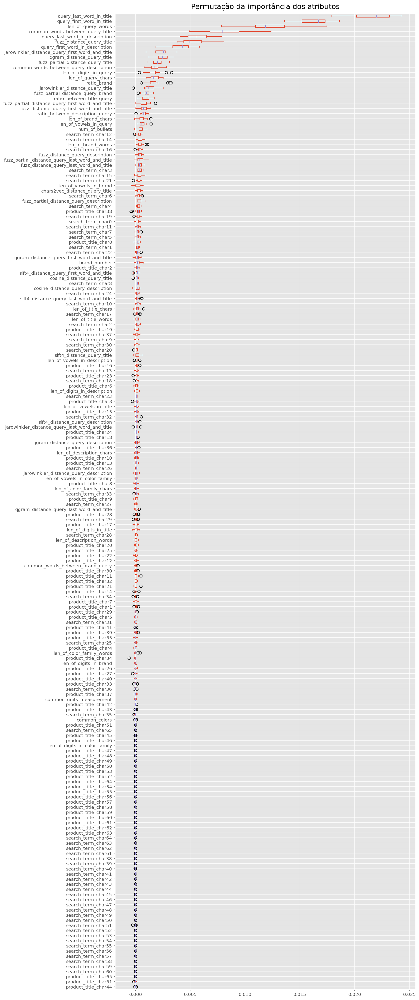

In [56]:
p_importances[p_importances.median().sort_values().index.tolist()].plot(kind='box', vert=False, figsize=(12, 40)).set_title('Permutação da importância dos atributos', fontdict=dict(fontsize=16), pad=10);

Com excessão dos 12 atributos no topo do gráfico, houve uma mudança significativa da importância dos atributos.

Vamos escolher os atributos que tenham importância acima da mediana e verificar a pontuação.

In [57]:
feat_imp = p_importances.apply(lambda x: x.mean())
features = feat_imp[feat_imp > feat_imp.median()].index.tolist()
len(features)

95

In [58]:
del reg, y_pred_train, y_pred_test 
throw = gc.collect()

In [59]:
start_time = time.time()

reg = Pipeline(steps=[('scaler', StandardScaler()),
                      ('rf_estimator', RandomForestRegressor(oob_score=True, random_state=0, n_jobs=-1))])

reg.fit(X_train[features], y_train)

y_pred_train = reg.predict(X_train[features])
y_pred_test = reg.predict(X_test[features])

print('--- Tempo de treino: %s minutos ---' % round(((time.time() - start_time) / 60), 2))

--- Tempo de treino: 0.92 minutos ---


In [60]:
print('Pontuação RMSE no treino: ', mean_squared_error(y_train, y_pred_train, squared=False))
print('Pontuação RMSE OOB:       ', sqrt(((y_train - reg.named_steps.rf_estimator.oob_prediction_) ** 2).sum() / y_train.size))
print('Pontuação RMSE no teste:  ', mean_squared_error(y_test, y_pred_test, squared=False))

Pontuação RMSE no treino:  0.17387099117526136
Pontuação RMSE OOB:        0.46752583958618593
Pontuação RMSE no teste:   0.46213219488722296


Retiramos metade dos atributos e a pontuação não se modificou consideravelmente. Através de experimentos empíricos, verificamos que 76 atributos é uma quantidade razoável para o nosso modelo.

In [61]:
feat_imp = p_importances.apply(lambda x: x.mean())
features = feat_imp[feat_imp > feat_imp.quantile(0.60)].index.tolist()
len(features)

76

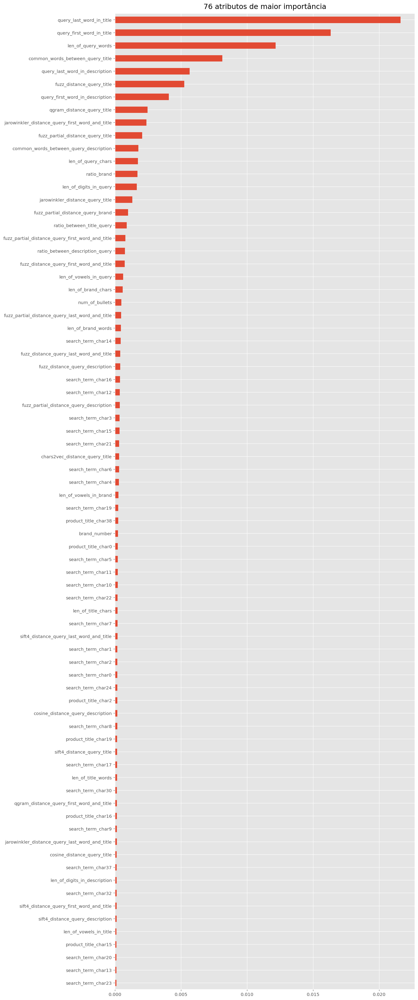

In [62]:
feat_imp[feat_imp > feat_imp.quantile(0.60)].sort_values().plot(kind='barh', figsize=(12, 40)).set_title('76 atributos de maior importância', fontdict=dict(fontsize=16), pad=10);

In [63]:
X_train = X_train[features]
X_test = X_test[features]

In [64]:
del reg, y_pred_train, y_pred_test 
throw = gc.collect()

<a id='other_models'></a>
<h2 style="color:DarkBlue" >Comparação com outros algoritmos</h2>

In [65]:
class DummyEstimator(BaseEstimator):
    def fit(self): pass
    def score(self): pass

reg2 = Pipeline(steps=[('scaler', StandardScaler()),
                       ('reg', DummyEstimator())])

search_space = [{'reg': [LinearRegression(n_jobs=-1)],
                },

                {'reg': [HuberRegressor()],
                },
                
                {'reg': [ARDRegression()],
                },

                {'reg': [RANSACRegressor(random_state=0)],
                },                

                {'reg': [SGDRegressor(random_state=0)],
                },
                
                {'reg': [PassiveAggressiveRegressor(random_state=0)],
                },              
                
                {'reg': [KNeighborsRegressor(n_jobs=-1)],
                },                              
                
                {'reg': [MLPRegressor(random_state=0)],
                },
                
                {'reg': [DecisionTreeRegressor(random_state=0)],
                },
                
                {'reg': [ExtraTreesRegressor(random_state=0, n_jobs=-1)],
                },
                
                {'reg': [RandomForestRegressor(random_state=0, n_jobs=-1)],
                },
                
                {'reg': [AdaBoostRegressor(random_state=0)],
                },
                
                {'reg': [GradientBoostingRegressor(random_state=0)],
                }
               ]

skf = KFold(n_splits=10, shuffle=True, random_state=0)
gs = GridSearchCV(estimator=reg2, param_grid=search_space, scoring='neg_root_mean_squared_error', cv=skf)

start_time = time.time()
gs.fit(X_train, y_train)
print('--- Tempo de treino: %s minutos ---' % round(((time.time() - start_time) / 60), 2))

--- Tempo de treino: 37.14 minutos ---


In [66]:
results = pd.DataFrame(gs.cv_results_).sort_values(by='rank_test_score')
cols = results.columns.tolist()
results[cols[:cols.index('param_reg') + 1] + ['rank_test_score'] + cols[cols.index('split0_test_score'):-1]]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_reg,rank_test_score,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score
10,41.715320,0.046416,0.122643,0.005238,"RandomForestRegressor(n_jobs=-1, random_state=0)",1,-0.473543,-0.463819,-0.465042,-0.458867,-0.463483,-0.466244,-0.467988,-0.465018,-0.463559,-0.465848,-0.465341,0.003555
9,30.839401,0.248740,0.134581,0.004751,"ExtraTreesRegressor(n_jobs=-1, random_state=0)",2,-0.479797,-0.468596,-0.472298,-0.466643,-0.470921,-0.472123,-0.473843,-0.471040,-0.466097,-0.472166,-0.471352,0.003706
12,43.363802,0.045017,0.028891,0.000316,GradientBoostingRegressor(random_state=0),3,-0.487210,-0.478362,-0.478519,-0.473266,-0.475308,-0.479113,-0.478607,-0.480832,-0.475708,-0.481751,-0.478868,0.003692
0,0.623330,0.012801,0.010137,0.001792,LinearRegression(n_jobs=-1),4,-0.487907,-0.482720,-0.483245,-0.477458,-0.480862,-0.483939,-0.484504,-0.484158,-0.476818,-0.488397,-0.483001,0.003624
2,0.406847,0.036241,0.009584,0.000027,ARDRegression(),5,-0.489353,-0.483745,-0.483661,-0.477692,-0.482062,-0.483759,-0.484509,-0.485184,-0.477515,-0.488754,-0.483623,0.003706
6,0.151023,0.018216,12.643444,0.103372,KNeighborsRegressor(n_jobs=-1),6,-0.489574,-0.481041,-0.490715,-0.476948,-0.482804,-0.488022,-0.488461,-0.485121,-0.487240,-0.485170,-0.485510,0.004031
1,4.628507,0.184484,0.009410,0.000060,HuberRegressor(),7,-0.491625,-0.485330,-0.485766,-0.479444,-0.484364,-0.486166,-0.487369,-0.486838,-0.479274,-0.491817,-0.485799,0.003988
4,0.354078,0.010500,0.008867,0.000069,SGDRegressor(random_state=0),8,-0.490189,-0.487184,-0.487430,-0.484680,-0.483942,-0.488574,-0.489496,-0.489483,-0.479995,-0.492779,-0.487375,0.003479
7,69.913547,11.181859,0.018952,0.000073,MLPRegressor(random_state=0),9,-0.495158,-0.485422,-0.488639,-0.483908,-0.486965,-0.490852,-0.492717,-0.494646,-0.494859,-0.491562,-0.490473,0.003863
11,8.762070,1.366397,0.032855,0.003968,AdaBoostRegressor(random_state=0),10,-0.508800,-0.506478,-0.504383,-0.500173,-0.502366,-0.505320,-0.505336,-0.504452,-0.502305,-0.505751,-0.504536,0.002312


Agora vamos treinar o nosso modelo com os melhores hiperparâmetros.

In [67]:
start_time = time.time()

reg = Pipeline(steps=[('scaler', StandardScaler()),
                      ('rf_estimator', RandomForestRegressor(n_estimators=1120, oob_score=True, random_state=0, n_jobs=-1))])

reg.fit(X_train, y_train)

y_pred_train = reg.predict(X_train)
y_pred_test = reg.predict(X_test)

print('--- Tempo de treino: %s minutos ---' % round(((time.time() - start_time) / 60), 2))

--- Tempo de treino: 8.16 minutos ---


In [68]:
print('Pontuação RMSE no treino: ', mean_squared_error(y_train, y_pred_train, squared=False))
print('Pontuação RMSE OOB:       ', sqrt(((y_train - reg.named_steps.rf_estimator.oob_prediction_) ** 2).sum() / y_train.size))
print('Pontuação RMSE no teste:  ', mean_squared_error(y_test, y_pred_test, squared=False))

Pontuação RMSE no treino:  0.1704531008163613
Pontuação RMSE OOB:        0.46148571472103184
Pontuação RMSE no teste:   0.4598401746463339


In [69]:
X_data = df_train.loc[X_test.index]

In [70]:
X_data['preds'] = reg.predict(X_test)
X_data['diff'] = (X_data['preds'] - X_data['relevance']).abs()

As predições com maior diferença em relação a relevância se encontram abaixo:

In [71]:
pandas.set_option('max_colwidth', 200)

In [72]:
X_data.sort_values(by=['diff'], ascending=False)[['product_uid', 'search_term', 'product_title', 'product_description', 'relevance', 'preds', 'diff']].head(20)

,product_uid,search_term,product_title,product_description,relevance,preds,diff
35619,135102,2.4 white board,speedi grill 24 in. xbi 6 in. base board return air vent grill with fix blade white,bbrag base board return grill is out of a durabl all steel construct with 1 2 in. fan shape louver and includ a volum damper. it has a white paintabl powder coat finish. bbrag also come in other s...,1.00,2.752240,1.752240
24352,121237,batteri oper flash light,kidd 10 year worri free batteri oper smoke alarm with led escap light 3 pack,kidd smoke alarm is power xbi seal long life lithium batteri for ten year the life of the alarm mean the alarm is alway on. this smoke alarm is ideal for the hallway. this ten year smoke has super...,1.00,2.720946,1.720946
32863,131446,liner,linzer 9 in. xbi 3 8 in. medium densiti polyest roller cover 6 pack,the 9 in. xbi 3 8 in. medium densiti polyest roller cover 6 pack are for use with both oil base and latex paints. these roller are reusabl if wash with water or miner spirit after each use.polyest...,1.00,2.678223,1.678223
67549,190460,bran gun,control brand visbi 12 light gun metal black chandeli,the visbi chandeli has twelv gun metal rod radiat out from a core ball. light from twelv e 26 40 watt bulb not includ point in all direct illumin a larg space.dur steel construct is built to last ...,1.00,2.667366,1.667366
24018,120872,plastic case,uti lite 2 ft. xbi 4 ft. lay in plastic ceil panel 32 sq.ft. / case,the need for a clean environ is met with uti lite easi to maintain ceil panels. these lightweight ceil panel are easi to instal into exist grid type ceilings. it plastic base panel materi allow it...,1.00,2.650250,1.650250
11123,107737,surebond,1 4 in. xbi 2 ft. xbi 2 ft. pure bond hickori plywood project panel,pure bond plywood project panel are a conveni and cost effect way to build cabinet furnitur and other woodwork projects. made in the usa with sustain harvest american hardwood they provid a beauti...,3.00,1.358366,1.641634
67432,190181,artifici ground cover,blue wave 8 year 16 ft. xbi 32 ft. rectangular navi blue in ground winter pool cover,the blue wave bronz grade cover has the strength and durabl of cover cost twice as much. rug polyethylen scrim and coat mean that this cover can withstand winter worst. blue wave cover are u v pro...,1.00,2.636121,1.636121
68510,192555,bird stop,heath bird stop blue ceram wild bird feeder,the bird stop blue ceram wild bird feeder featur a blend of ceram and metal construction. the circular open are ideal for feed sunflow seed shell peanut or mealworms. hold up to 1 lb. of seed. dra...,1.00,2.631446,1.631446
14736,111134,free ship,globalros red mini carnat 160 stem includ free ship,mini red carnat are grown in environment greenhous with the cut edg technolog in exist which is whi we can promis superior flower year round. we can promis fresh superior bulk carnat becaus they a...,1.00,2.598170,1.598170
30080,127941,4 xbi 4 pressur treat post,4 in. xbi 4 in. pressur treat unfinish pine ball top finial,the weather shield 4 in. xbi 4 in. pressur treat unfinish pine ball top finial offer an easi attract way to protect or enhanc exterior posts. use it to cover unsight or rot post top or simpli to l...,1.00,2.531009,1.531009


A permutação da importância dos atributos:

In [73]:
start_time = time.time()

permuter = PermutationImportance(reg, scoring='neg_root_mean_squared_error', cv='prefit', n_iter=5, random_state=0)
permuter.fit(X_train, y_train)

print('--- Tempo: %s minutos ---' % round(((time.time() - start_time) / 60), 2))

--- Tempo: 33.27 minutos ---


In [74]:
eli5.show_weights(permuter, top=None, feature_names=X_train.columns.tolist())

Weight,Feature
0.2037 ± 0.0012,query_last_word_in_title
0.1708 ± 0.0016,len_of_query_words
0.1684 ± 0.0016,query_first_word_in_title
0.1543 ± 0.0011,fuzz_distance_query_title
0.0906 ± 0.0012,common_words_between_query_title
0.0858 ± 0.0011,jarowinkler_distance_query_first_word_and_title
0.0773 ± 0.0005,jarowinkler_distance_query_title
0.0745 ± 0.0005,ratio_between_description_query
0.0647 ± 0.0006,fuzz_partial_distance_query_title
0.0633 ± 0.0012,query_first_word_in_description


<a id='conclusion'></a>
<h2 style="color:DarkBlue" >Conclusão</h2>

Criamos um modelo que prediz com precisão a relevância dos resultados de pesquisa da organização Home Depot. Normalizamos os dados e selecionamos os atributos de maior importância à relevância dos produtos.

Para melhorar a pontuação obtida na métrica RMSE, pode-se realizar ensemble com outros modelos.

<a id='my_notebooks'></a>
<h2 style="color:Darkblue" >Meus notebooks</h2>

In [75]:
HTML(open('home_notebooks.html', 'r').read())

<a id='contact'></a>
<h2 style="color:Darkblue" >Contato</h2>

- **Email**: [rc3bastos@gmail.com](mailto:rc3bastos@gmail.com)
- **LinkedIn**: [linkedin.com/in/rc3bastos/](https://www.linkedin.com/in/rc3bastos/)